<a href="https://colab.research.google.com/github/asampat3090/musicalai/blob/dev/_4_audio_representations.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Audio Representations

Audio encoding is a [complex field](https://en.wikipedia.org/wiki/Advanced_Audio_Coding) and one we certainly can't cover comprehensively in one notebook. Instead our goal will be to go through some core tenets of audio representation we care about for prompting and training AI models.

My goal in this notebook and blog post is to provide some clarity and examples for how to work with Audio data. Hugging Face has a great notebook for [Language tokenization](https://colab.research.google.com/github/huggingface/notebooks/blob/main/transformers_doc/en/tokenizer_summary.ipynb) which we aim to emulate here. Recently, given the popularity of language tokenization techniques for language modeling, "Audio Tokenization" has also gained favor as a way to describe discretizing audio waveforms, however the concept has been around for ages since the advent of the digital age.

In this notebook we will go over the basic audio transformations and tokenizations and compare them to language analogs so we can understand the inputs to our models. Recent encoders and tokenization schemes are themselves complex models.

This will form the basis for us to start to build up the beginnings of a  decoder-only model that generates audio using audio prompting and eventually build up to training a MusicGPT.

# Setup Notebook

In [ ]:
# setup notebook to process audio snippets from drive

# install appropriate libraries
!pip install pydub # pydub is a useful library for audio manipulation
!pip install torchaudio # ensure torchaudio is installed
!pip install librosa # librosa is another useful audio manipulation library

# import useful audio manipulation libraries
import os
import torch
import torchaudio
from pydub import AudioSegment
from pydub.playback import play
import librosa
import locale
locale.getpreferredencoding = lambda: "UTF-8"

# setup google drive mount
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Audio Data
Let's go through some simple audio transformations and learn how to embed these audio files into tokens that will be learnable by the model.


In [ ]:
from IPython.display import Audio, display # display Audio as needed

## Raw Audio as a Tensor

First, we will attempt to use a simple raw representation of the audio. Our samples are stereo so we will convert them to mono using `pydub` which uses `ffmpeg` backend to merge the two channels to preserve the audio.

Note: This time sampled representation is similar to representing a sequence of strings from the Shakespeare dataset as characters as was done in nanoGPT here: https://www.youtube.com/watch?v=kCc8FmEb1nY&ab_channel=AndrejKarpathy

The difference however is that the codebook size here is very large because size of the the possible set of float values is ~$∞$ (practically, it is some large number based on the floating point precision). In order to use this, we would need to convert the model output to a continuous output or revisit this representation. We will come back to both of these shortly.

In [ ]:
# test process a 30 second audio clip
test_audio_dir = '/content/drive/MyDrive/Colab Notebooks/train-data'
test_audio_name = '013_002.wav'
test_audio_path = os.path.join(test_audio_dir,test_audio_name)

# load and play stereo (2 channel) audio using Torch
sample = torchaudio.load(test_audio_path)
print("audio shape:", sample[0].shape)
print("frame rate:", sample[1])

Audio(sample[0], rate=sample[1])

audio shape: torch.Size([2, 1323000])
frame rate: 44100


In [ ]:
# convert stereo audio to mono
# load into pydub - merge channels to mono then save to file
sample_audio_segment = AudioSegment.from_file(test_audio_path)
sample_audio_segment = sample_audio_segment.set_channels(1)
mono_audio_path = os.path.join(test_audio_dir,'013_002_mono.wav')
sample_audio_segment.export(mono_audio_path,format='wav')

# load to torchaudio and confirm it is mono
sample_mono, sample_sr = torchaudio.load(mono_audio_path)
print("audio shape:", sample_mono.shape)
print("sample rate:", sample_sr)
Audio(sample_mono, rate=sample_sr)

audio shape: torch.Size([1, 1323000])
sample rate: 44100


We might have lost a bit of granularity in the music but to the human ear there isn't a huge change, so ideally this will not be an aspect we need to revisit since changing this won't affect the final output.

## Spectrograms

We use multiple `torchaudio` transforms - a great explanation of usage and transformations between waveform, spectrogram, power spectrogram and mel spectrogram representations are shown here: https://pytorch.org/audio/stable/transforms.html

torch.Size([1, 401, 3308])
tensor([[[1.9802e+01, 8.3226e-02, 7.2202e-02,  ..., 5.4471e-02,
          7.6805e-05, 1.2331e+01],
         [1.8892e+01, 6.5924e-01, 2.3272e-01,  ..., 4.0464e-01,
          3.3065e-01, 1.7946e+01],
         [2.0765e+02, 5.5419e+01, 4.1121e+01,  ..., 1.5355e+01,
          1.6259e+01, 4.2347e+01],
         ...,
         [7.2633e-04, 7.9031e-08, 2.1982e-08,  ..., 3.2319e-08,
          1.7466e-08, 1.0067e-07],
         [7.2600e-04, 3.2228e-08, 9.6031e-09,  ..., 5.3386e-08,
          9.4671e-08, 1.0213e-07],
         [7.3063e-04, 1.7794e-08, 7.5315e-09,  ..., 8.6112e-08,
          7.5351e-08, 3.5286e-07]]])


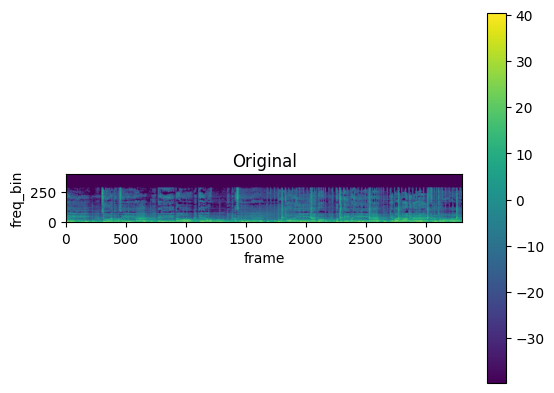

In [ ]:
transform = torchaudio.transforms.Spectrogram(n_fft=800)
spectrogram = transform(sample_mono)
print(spectrogram.shape)
print(spectrogram)

import matplotlib as mpl
import matplotlib.pyplot as plt

def plot_spectrogram(spec: torch.tensor, title=None, ylabel="freq_bin", aspect="auto", xmax=None) -> None:
    fig, axs = plt.subplots(1, 1)
    axs.set_title(title or "Spectrogram (db)")
    axs.set_ylabel(ylabel)
    axs.set_xlabel("frame")
    im = axs.imshow(librosa.power_to_db(spec), origin="lower", aspect=aspect)
    if xmax:
        axs.set_xlim((0, xmax))
    fig.colorbar(im, ax=axs)
    plt.show(block=False)

plot_spectrogram(torch.abs(spectrogram[0]), title="Original", aspect="equal")

We can also do augmentations on these spectrograms.

https://pytorch.org/audio/stable/tutorials/audio_feature_augmentation_tutorial.html#sphx-glr-tutorials-audio-feature-augmentation-tutorial-py

These transforms are useful for training our models, and can be done at the spectrogram level before converting our audio files into codebooks.

Let's explore a few, so we are clear on what they do so we can use them when we eventually train our models.

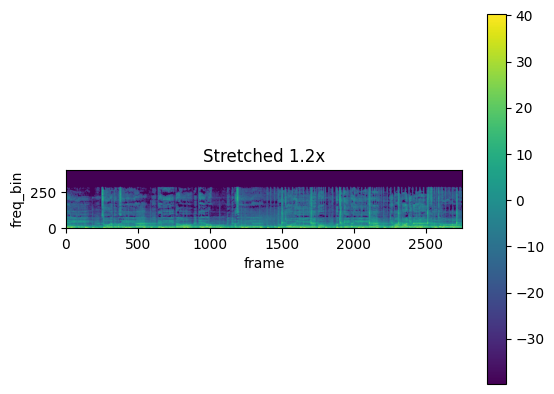

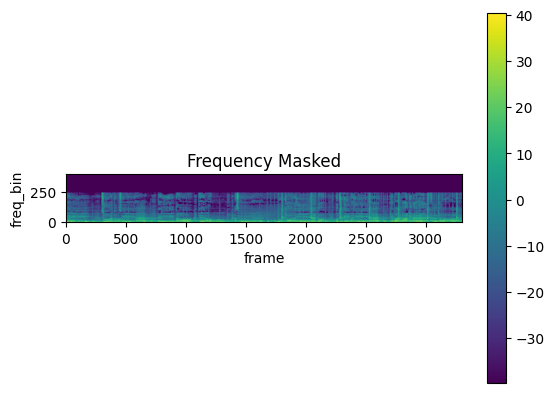

In [ ]:
orig_spec = spectrogram[0]
# time stretch
stretch_transform = torchaudio.transforms.TimeStretch(n_freq=401) # match the freq bins
stretched_spec = stretch_transform(orig_spec, 1.2) #stretch by 1.2x
plot_spectrogram(torch.abs(stretched_spec), title="Stretched 1.2x", aspect="equal")
# time masking ERRORS
# time_mask_transform = torchaudio.transforms.TimeMasking(time_mask_param=10)
# time_masked_spec = time_mask_transform(orig_spec)
# plot_spectrogram(torch.abs(time_masked_spec), title="Time Masked", aspect="equal")
# frequency masking
freq_mask_transform = torchaudio.transforms.FrequencyMasking(freq_mask_param=80)
freq_masked_spec = freq_mask_transform(orig_spec)
plot_spectrogram(torch.abs(freq_masked_spec), title="Frequency Masked", aspect="equal")

## Codebook Representation

So far we have converted a raw waveform with multiple channels to a single channel spectrogram representation. This representation is the basis for further encoding. Each value in the spectrogram is a continuous float32 value, but to convert this to a classification problem at each time step, a discrete integer-based representation would be better. This is where codebooks come in.

Creating a more compressed codebook from spectrogram will help to quantize the floating point values. Similar to a character level model in language where we might have 65 characters that can result in an index representation of tokens (e.g. a 4 character string as `[0, 1, 64, 2]`), we would like a similar index representation of the audio spectrogram. [Video: Karpathy's GPT tokenization](https://youtu.be/kCc8FmEb1nY?t=762)

We will use some pytorch transforms above and existing neural compression models to convert it to a discrete codebook. We won't delve into the details of each model, but will drop links to delve deeper and rather focus on the format of the outputs and usage.

Let's explore two similar methods from Meta (Encodec) and Google (SoundStream) using transformers along with Residual Vector Quantization.

In [ ]:
# loading into tensor format
path = '/content/drive/MyDrive/Colab Notebooks/train-data/013_002.wav'

### EnCodec from Meta

Meta introduced EnCodec in October 2022 to extract discrete representations from the audio waveform using a transformer and residual vector quantization architecture in their paper on ["High-fidelity Neural Audio Compression"](https://arxiv.org/abs/2210.13438). They showed improved decoder results with a diffusion-based architecture in ["From Discrete Tokens to High-Fidelity Audio Using Multi-Band Diffusion"](https://arxiv.org/abs/2308.02560) recently in 2023, but that will be more important for when once we generate music and want to obtain a higher quality sample - we'll come back to it in a later post. Meta AI has compiled this Audio Compression under their Audiocraft library. You can find the latest here: https://audiocraft.metademolab.com/encodec.html. For the purpose of this discussion, we will ignore the full training of the model displayed below but will study how it is used to compress the audio in a discrete representation during inference - i.e. the encoder and RVQ blocks.

We use the 32khz version of the EnCodec present in the pretrained [MusicGen model](https://paperswithcode.com/paper/simple-and-controllable-music-generation). You can also pull from different pretrained EnCodec models to test multiple sampling types. Choosing the right sampling rate depends on the bandwidth of the original signal. Speech often will make do with 16khz or less, though music often fares better with higher sampling rates 32khz and above.

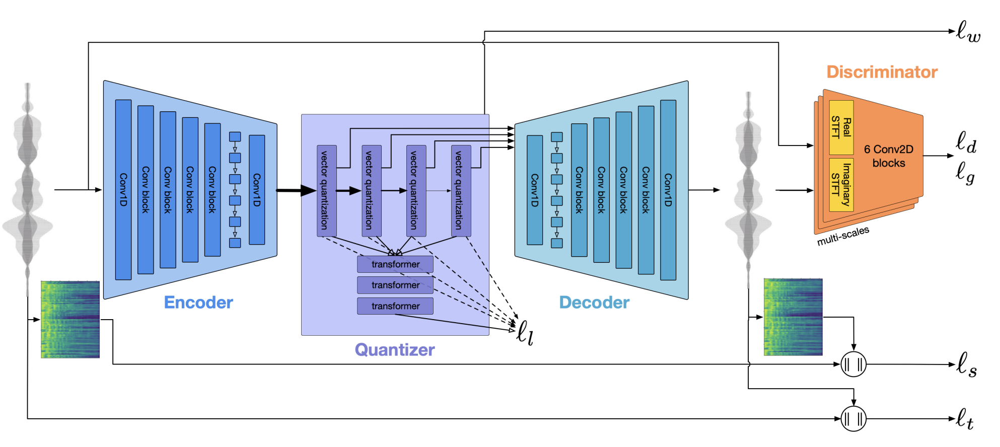

In [ ]:
# setup
!pip install audiocraft

In [ ]:
# Let us try Encodec as an example which was released by Meta AI before doing something simple.

# Good explanation of a codebook and the final encoded representation using Encodec: https://www.youtube.com/watch?v=-2BS70rDVwk&ab_channel=GabrielMongaras

from audiocraft.models import MusicGen

# loading in the MusicGen model
model = MusicGen.get_pretrained('small')
print(model.sample_rate) # 32 khz sample rate

# update language model with float32 (for efficiency?)
model.lm = model.lm.to(torch.float32)

def preprocess_audio(audio_path, model: MusicGen, duration: int = 30):
    wav, sr = torchaudio.load(audio_path)
    # resample to the models sample rate for the right dims
    wav = torchaudio.functional.resample(wav, sr, model.sample_rate)
    # collapse 0th dim to mean value
    wav = wav.mean(dim=0, keepdim=True)
    print(wav.size())
    end_sample = int(model.sample_rate * duration)
    wav = wav[:, :end_sample]

    assert wav.shape[0] == 1
    assert wav.shape[1] == model.sample_rate * duration

    wav = wav.cuda()
    wav = wav.unsqueeze(1)

    with torch.no_grad():
        gen_audio = model.compression_model.encode(wav)

    codes, scale = gen_audio

    assert scale is None

    return codes

codes = preprocess_audio(path,model)
print(codes)
print(type(codes))
print(codes.shape)

32000
torch.Size([1, 960000])
tensor([[[1644, 1397,  795,  ..., 1452, 1437, 1454],
         [1809,  692, 1896,  ..., 1642, 1239, 2029],
         [1759, 1194,  335,  ..., 1107,  261,  900],
         [1452, 1962, 1097,  ...,  302,  894, 1686]]], device='cuda:0')
<class 'torch.Tensor'>
torch.Size([1, 4, 1500])


The encoded audio string is now encoded using 4 different codebooks with 1500 time steps. Each time step will have an integer which represents the index for that codebook.


***SHOW A NICE PICTURE HERE OF THE CODEBOOK REPRESENTATION.***

In [ ]:
# print one value from the encoded representation
print(codes.squeeze()[0][1200])

tensor(695, device='cuda:0')


### Exploring an EnCodec Codebook
Now that we have a couple of codebooks let's delve a bit deeper. A codebook is like a lookup table. For example we might have `4` codebooks with `2048` values each. This means that each time step we will have 4 values between `0` and `2047`. Similar to the [VQ-VAE2 paper](https://arxiv.org/abs/1906.00446) we can think of each codebook capturing a different more specific feature of the audio. Let's confirm the max, and take a look at a timestep of the EnCodec representation in `codes`.


In [ ]:
print("Max Index for Encodec:", torch.max(codes))
print("Timestep #2 values:", codes.squeeze()[:,2])

Max Index for Encodec: tensor(2047, device='cuda:0')
Timestep #2 values: tensor([ 795, 1896,  335, 1097], device='cuda:0')


How did we get to this codebook? If we revisit the architecture of EnCodec and only focus on the compression, we focus on the encoder and the residual vector quantization layers.

* The encoder layer cascade of convolutional blocks transforms a 32kHz into a 50Hz by striding over the waveform in the time-domain with an effective stride of 640 and 64 dim hidden state.

* The Residual Vector Quantizer will quantize the 50Hz signal using 4 codebooks each of size 2048. What if we didn't do this? Let's say that we want to represent this audio at a 2200 bitrate (i.e. bits / second). A 50Hz signal would require 44 bits, or a vector of size $2^{44}$ representing each discrete value. This is infeasible, so instead with 4 codebooks we reduce this to $2^{44/4}=2^{11}=2048$.

Now we can represent each sample (i.e. every $1/50$th of a second) with a 4 value codebook representation as above.

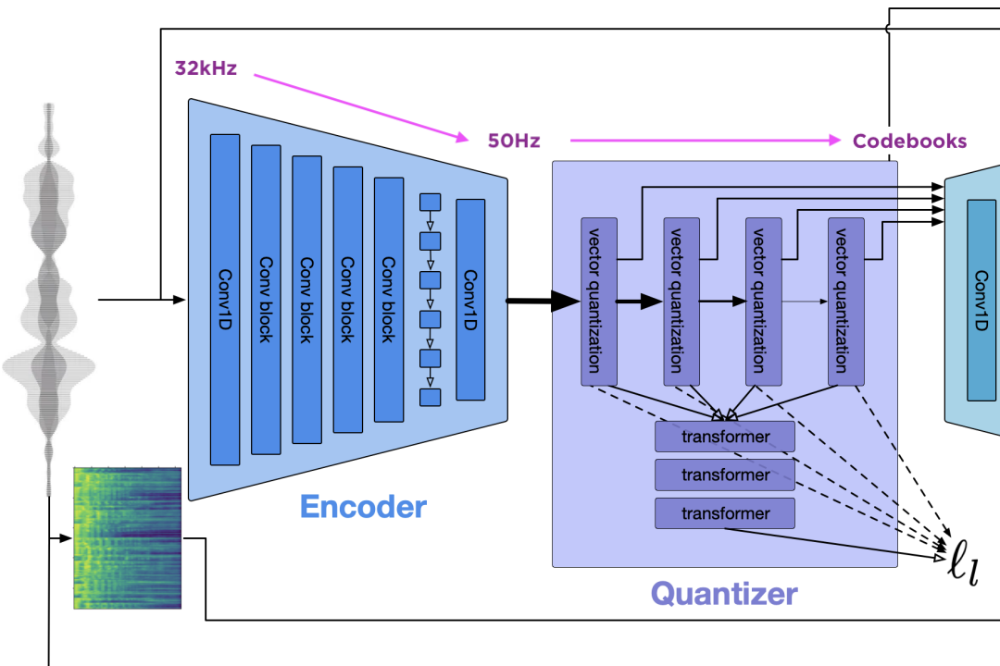

### SoundStream: Google
Google released a similar architecture for compression in Aug 2021 called SoundStream which can also be used to encode audio into a codebook depending on the user-specified params. [Original Google AI Blog](https://ai.googleblog.com/2021/08/soundstream-end-to-end-neural-audio.html). You can find multiple implementations of this representation in the [Papers with Code](https://paperswithcode.com/paper/soundstream-an-end-to-end-neural-audio-codec) link. Again we won'd talk too much about the training piece but will walk through the inference time compression which results in a codebook. Benchmark-wise, SoundStream was shown to be strictly worse both on qualitative metrics like MUSHRA [link text](https://en.wikipedia.org/wiki/MUSHRA) in the [EnCodec paper](https://arxiv.org/pdf/2210.13438.pdf) but it's worth exploring.

We want to find a representation that works well with music, i.e. one that is closer to the 32kHz used by the EnCodec model used for MusicGen above.

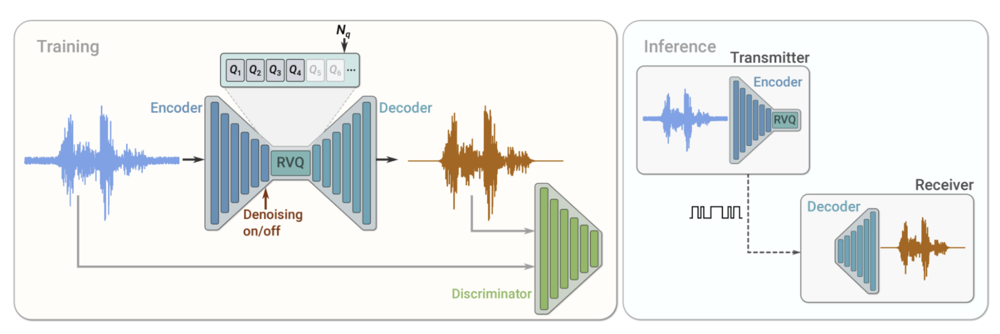

First let's try a pre-trained 16kHz model to ensure we understand what's happening. This isn't an official implementation, so we are

In [ ]:
# We will attempt using a re-implmented version in pytorch: https://github.com/kaiidams/soundstream-pytorch

# Explanation of Soundstream neural audio codec: https://www.youtube.com/watch?v=L6wiWYCCGFM&ab_channel=EgorShvecov

model = torch.hub.load("kaiidams/soundstream-pytorch", "soundstream_16khz")
x, sr = torchaudio.load(path)
x, sr = torchaudio.functional.resample(x, sr, 16000), 16000
# collapse 0th dim to mean value
x = x.mean(dim=0, keepdim=True)
print(x.shape)
with torch.no_grad():
    codes_ss = model.encode(x)
    # y = y[:, :, :4]  # if you want to reduce code size.
    z = model.decode(codes_ss)
# torchaudio.save('output.wav', z, sr)
print(codes_ss.shape)
print(codes_ss)
print(z.shape)

Using cache found in /root/.cache/torch/hub/kaiidams_soundstream-pytorch_main


torch.Size([1, 480000])
torch.Size([1, 1484, 8])
tensor([[[627, 902, 426,  ..., 667, 455, 595],
         [627, 522, 538,  ..., 765, 146, 102],
         [732, 871, 236,  ..., 701, 509, 400],
         ...,
         [622, 643, 840,  ..., 503, 499, 400],
         [ 67, 497, 438,  ..., 921, 570, 558],
         [999, 449, 234,  ..., 531,  20, 791]]])
torch.Size([1, 469346])


In [ ]:
# More Comparisons between SoundStream, EnCodec and HiFi models can be done here: https://github.com/yangdongchao/AcademiCodec
# https://docs.openvino.ai/2023.0/notebooks/234-encodec-audio-compression-with-output.html

# Training using EnCodec or SoundStream representations

In [ ]:
# prompt: use the representations above to train a recurrent neural net that predicts the next sequence and then decodes it

from torch import nn
from torch import optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.model_selection import train_test_split
import torch.nn.functional as F
import numpy as np
from tqdm import tqdm
import torch.nn.utils.rnn as rnn
from torch.nn.utils.rnn import pad_sequence

class Encoder(nn.Module):
    def __init__(self, input_dim=512, hidden_dim=512, num_layers=2):
        super().__init__()
        self.lstm = nn.LSTM(input_dim=input_dim, hidden_dim=hidden_dim, num_layers=num_layers, batch_first=True)

    def forward(self, x):
        x = rnn.pack_padded_sequence(x, x.sum(dim=1), batch_first=True, enforce_sorted=False)
        out, (h, c) = self.lstm(x)
        out = rnn.pad_packed_sequence(out, batch_first=True)
        return out, h, c

class Decoder(nn.Module):
    def __init__(self, input_dim=512, hidden_dim=512, num_layers=2):
        super().__init__()
        self.lstm = nn.LSTM(input_dim=input_dim, hidden_dim=hidden_dim, num_layers=num_layers, batch_first=True)
        self.linear = nn.Linear(hidden_dim, 512)

    def forward(self, x, h, c):
        x = rnn.pack_padded_sequence(x, x.sum(dim=1), batch_first=True, enforce_sorted=False)
        out, (h, c) = self.lstm(x, (h, c))
        out = rnn.pad_packed_sequence(out, batch_first=True)
        out = self.linear(out[0])
        return out, h, c

class Autoencoder(nn.Module):
    def __init__(self, input_dim=512, hidden_dim=512, num_layers=2):
        super().__init__()
        self.encoder = Encoder(input_dim=input_dim, hidden_dim=hidden_dim, num_layers=num_layers)
        self.decoder = Decoder(input_dim=hidden_dim, hidden_dim=hidden_dim, num_layers=num_layers)

    def forward(self, x):
        out, h, c = self.encoder(x)
        out, h, c = self.decoder(out, h, c)
        return out

def train(model, train_loader, optimizer, criterion):
    model.train()
    loss = 0.0
    for x, y in tqdm(train_loader):
        optimizer.zero_grad()
        out = model(x)
        loss = criterion(out, y)
        loss.backward()
        optimizer.step()
    return loss

def evaluate(model, test_loader, criterion):
    model.eval()
    loss = 0.0
    with torch.no_grad():
        for x, y in test_loader:
            out = model(x)
            loss += criterion(out, y).item()
    return loss / len(test_loader)

def main():
    # Load the data
    x_train, x_test = train_test_split(codes_ss.numpy(), test_size=0.2)
    x_train = torch.from_numpy(x_train).float()
    x_test = torch.from_numpy(x_test).float()

    # Create the dataloaders
    train_loader = DataLoader(TensorDataset(x_train), batch_size=128, shuffle=True)
    test_loader = DataLoader(TensorDataset(x_test), batch_size=128, shuffle=False)

    # Create the model
    model = Autoencoder()

    # Create the optimizer and criterion
    optimizer = optim.Adam(model.parameters(), lr=0.001)
    criterion = nn.MSELoss()

    # Train the model
    for epoch in range(100):
        train_loss = train(model, train_loader, optimizer, criterion)
        test_loss = evaluate(model, test_loader, criterion)
        print(f"Epoch {epoch+1}: Train loss = {train_loss:.4f}, Test loss = {test_loss:.4f}")

    # Save the model
    torch.save(model, "autoencoder.pt")

if __name__ == "__main__":
    main()


NameError: ignored